In [1]:
import torch

import torch.nn as nn
import torch.nn.functional as F

from torchvision.datasets import MNIST
from sklearn.model_selection import train_test_split

from torch.utils.data import Dataset, DataLoader, Subset, random_split

import torchvision.transforms as transforms

import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import random

In [2]:
import os

print(os.environ.get("CUDA_PATH"))


# os.environ["CUDA_LAUNCH_BLOCKING"] = "1"

# os.environ["CUDA_VISIBLE_DEVICES"] = "0"

C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v11.2


In [3]:
from train import *

In [4]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
print(f"==>> device: {device}")

==>> device: cuda


In [5]:
def seed_everything(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # if use multi-GPU
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    # cudnn은 conv 과정에서 여러 알고리즘의 benchmark를 수행해 
    # 가장 빠른 알고리즘 선정해 수행 
    # -> True로 두면 시행마다 다른 알고리즘이 선택되어 결과가 달라질 수 있다
    # https://tempdev.tistory.com/28
    np.random.seed(seed)
    random.seed(seed)


seed_everything(42)

In [6]:
hp = {}

hp["device"] = device
# hp["device"] = "cpu"
# cpu로 하면 에러메시지가 더 자세해서 디버깅에 용이
hp["epochs"] = 1000
hp["batch_size"] = 100
# hp["run_name"] = "AAE_0127_relu_std"
hp["wandb"] = "online"

In [7]:
hp["encoder"] = EncoderWithReParam(28 * 28, 2).to(hp["device"])
hp["decoder"] = Decoder(2, 28 * 28).to(hp["device"])
hp["discriminator"] = Discriminator(2, 11).to(hp["device"])
params = [hp["encoder"].parameters(), hp["decoder"].parameters()]
hp["optim_ae"] = SGD(itertools.chain(*params), lr=0.01)
hp["scheduler_ae"] = MultiStepLR(hp["optim_ae"], milestones=[50, 500], gamma=0.1)
hp["optim_en"] = SGD(hp["encoder"].parameters(), lr=0.1)
hp["scheduler_en"] = MultiStepLR(hp["optim_en"], milestones=[50, 500], gamma=0.1)
hp["optim_dc"] = SGD(hp["discriminator"].parameters(), lr=0.1)
hp["scheduler_dc"] = MultiStepLR(hp["optim_dc"], milestones=[50, 500], gamma=0.1)

In [8]:
# def pre_hook(module, input):
#     print(module)
#     print(f"==>> module.weight: {module.weight}")
#     print(f"==>> input: {input}")
#     pass


# def hook(module, input, output):
#     print(f"==>> output: {output}")
#     pass


# def module_hook(module, grad_input, grad_output):
#     print(module)
#     print(f"==>> grad_input: {grad_input}")
#     print(f"==>> grad_output: {grad_output}")
#     pass


# hp["encoder"].logvar.register_forward_pre_hook(pre_hook)
# hp["encoder"].logvar.register_forward_hook(hook)
# hp["encoder"].logvar.register_full_backward_hook(module_hook)


In [9]:
# torch.autograd.set_detect_anomaly(True)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: pao-kim-si-woong. Use `wandb login --relogin` to force relogin


Epoch[0/1000](100/100) || r_loss_sv 0.7696 d_loss_sv 1.353 g_loss_sv -1.346
Epoch[0/1000](500/500) || r_loss_unsv 0.3641 d_loss_unsv 1.418 g_loss_unsv -1.404
Calculating validation results...
[test] loss_r: 0.29, loss_d:  1.4, loss_g: -1.4
Epoch[1/1000](100/100) || r_loss_sv 0.2808 d_loss_sv 1.248 g_loss_sv -1.231
Epoch[1/1000](500/500) || r_loss_unsv 0.266 d_loss_unsv 1.381 g_loss_unsv -1.359
Calculating validation results...
[test] loss_r: 0.26, loss_d:  1.3, loss_g: -1.3
Epoch[2/1000](100/100) || r_loss_sv 0.2552 d_loss_sv 1.091 g_loss_sv -1.068
Epoch[2/1000](500/500) || r_loss_unsv 0.2518 d_loss_unsv 1.363 g_loss_unsv -1.339
Calculating validation results...
[test] loss_r: 0.25, loss_d:  1.3, loss_g: -1.3
Epoch[3/1000](100/100) || r_loss_sv 0.2471 d_loss_sv 0.9642 g_loss_sv -0.9334
Epoch[3/1000](500/500) || r_loss_unsv 0.2445 d_loss_unsv 1.346 g_loss_unsv -1.315
Calculating validation results...
[test] loss_r: 0.24, loss_d:  1.3, loss_g: -1.3
Epoch[4/1000](100/100) || r_loss_sv 0.2

Epoch[10/1000](100/100) || r_loss_sv 0.2323 d_loss_sv 1.047 g_loss_sv -0.9925
Epoch[10/1000](500/500) || r_loss_unsv 0.2307 d_loss_unsv 1.442 g_loss_unsv -1.4
Calculating validation results...
[test] loss_r: 0.23, loss_d:  1.5, loss_g: -1.5
Epoch[11/1000](100/100) || r_loss_sv 0.2294 d_loss_sv 1.06 g_loss_sv -1.016
Epoch[11/1000](500/500) || r_loss_unsv 0.2298 d_loss_unsv 1.433 g_loss_unsv -1.391
Calculating validation results...
[test] loss_r: 0.23, loss_d:  1.5, loss_g: -1.5
Epoch[12/1000](100/100) || r_loss_sv 0.2272 d_loss_sv 1.026 g_loss_sv -0.9771
Epoch[12/1000](500/500) || r_loss_unsv 0.2276 d_loss_unsv 1.447 g_loss_unsv -1.405
Calculating validation results...
[test] loss_r: 0.23, loss_d:  1.5, loss_g: -1.5
Epoch[13/1000](100/100) || r_loss_sv 0.2267 d_loss_sv 1.032 g_loss_sv -0.9897
Epoch[13/1000](500/500) || r_loss_unsv 0.2263 d_loss_unsv 1.449 g_loss_unsv -1.411
Calculating validation results...
[test] loss_r: 0.22, loss_d:  1.4, loss_g: -1.4
Epoch[14/1000](100/100) || r_los

Epoch[20/1000](100/100) || r_loss_sv 0.2215 d_loss_sv 1.02 g_loss_sv -0.9729
Epoch[20/1000](500/500) || r_loss_unsv 0.2231 d_loss_unsv 1.458 g_loss_unsv -1.422
Calculating validation results...
[test] loss_r: 0.22, loss_d:  1.4, loss_g: -1.4
Epoch[21/1000](100/100) || r_loss_sv 0.2216 d_loss_sv 0.984 g_loss_sv -0.9273
Epoch[21/1000](500/500) || r_loss_unsv 0.2231 d_loss_unsv 1.458 g_loss_unsv -1.423
Calculating validation results...
[test] loss_r: 0.22, loss_d:  1.5, loss_g: -1.5
Epoch[22/1000](100/100) || r_loss_sv 0.2212 d_loss_sv 1.022 g_loss_sv -0.9742
Epoch[22/1000](500/500) || r_loss_unsv 0.2236 d_loss_unsv 1.455 g_loss_unsv -1.417
Calculating validation results...
[test] loss_r: 0.22, loss_d:  1.4, loss_g: -1.4
Epoch[23/1000](100/100) || r_loss_sv 0.2196 d_loss_sv 1.093 g_loss_sv -1.04
Epoch[23/1000](500/500) || r_loss_unsv 0.2235 d_loss_unsv 1.458 g_loss_unsv -1.425
Calculating validation results...
[test] loss_r: 0.22, loss_d:  1.4, loss_g: -1.4
Epoch[24/1000](100/100) || r_lo

Epoch[30/1000](100/100) || r_loss_sv 0.2161 d_loss_sv 1.209 g_loss_sv -1.173
Epoch[30/1000](500/500) || r_loss_unsv 0.2189 d_loss_unsv 1.461 g_loss_unsv -1.432
Calculating validation results...
[test] loss_r: 0.22, loss_d:  1.4, loss_g: -1.4
Epoch[31/1000](100/100) || r_loss_sv 0.2159 d_loss_sv 1.208 g_loss_sv -1.163
Epoch[31/1000](500/500) || r_loss_unsv 0.219 d_loss_unsv 1.459 g_loss_unsv -1.43
Calculating validation results...
[test] loss_r: 0.22, loss_d:  1.6, loss_g: -1.6
Epoch[32/1000](100/100) || r_loss_sv 0.2154 d_loss_sv 1.22 g_loss_sv -1.179
Epoch[32/1000](500/500) || r_loss_unsv 0.2189 d_loss_unsv 1.46 g_loss_unsv -1.434
Calculating validation results...
[test] loss_r: 0.22, loss_d:  1.5, loss_g: -1.5
Epoch[33/1000](100/100) || r_loss_sv 0.2149 d_loss_sv 1.224 g_loss_sv -1.18
Epoch[33/1000](500/500) || r_loss_unsv 0.2181 d_loss_unsv 1.459 g_loss_unsv -1.433
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[34/1000](100/100) || r_loss_sv 

Epoch[40/1000](100/100) || r_loss_sv 0.2151 d_loss_sv 1.247 g_loss_sv -1.208
Epoch[40/1000](500/500) || r_loss_unsv 0.2164 d_loss_unsv 1.451 g_loss_unsv -1.426
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[41/1000](100/100) || r_loss_sv 0.2138 d_loss_sv 1.258 g_loss_sv -1.215
Epoch[41/1000](500/500) || r_loss_unsv 0.2173 d_loss_unsv 1.45 g_loss_unsv -1.423
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.5, loss_g: -1.5
Epoch[42/1000](100/100) || r_loss_sv 0.2141 d_loss_sv 1.264 g_loss_sv -1.223
Epoch[42/1000](500/500) || r_loss_unsv 0.2168 d_loss_unsv 1.449 g_loss_unsv -1.423
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.5, loss_g: -1.5
Epoch[43/1000](100/100) || r_loss_sv 0.2143 d_loss_sv 1.273 g_loss_sv -1.232
Epoch[43/1000](500/500) || r_loss_unsv 0.2162 d_loss_unsv 1.449 g_loss_unsv -1.426
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.5, loss_g: -1.5
Epoch[44/1000](100/100) || r_loss

Epoch[50/1000](100/100) || r_loss_sv 0.2151 d_loss_sv 1.279 g_loss_sv -1.267
Epoch[50/1000](500/500) || r_loss_unsv 0.2143 d_loss_unsv 1.384 g_loss_unsv -1.378
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[51/1000](100/100) || r_loss_sv 0.2115 d_loss_sv 1.237 g_loss_sv -1.221
Epoch[51/1000](500/500) || r_loss_unsv 0.2129 d_loss_unsv 1.384 g_loss_unsv -1.376
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.5, loss_g: -1.5
Epoch[52/1000](100/100) || r_loss_sv 0.2115 d_loss_sv 1.219 g_loss_sv -1.205
Epoch[52/1000](500/500) || r_loss_unsv 0.213 d_loss_unsv 1.383 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.5, loss_g: -1.5
Epoch[53/1000](100/100) || r_loss_sv 0.2112 d_loss_sv 1.225 g_loss_sv -1.205
Epoch[53/1000](500/500) || r_loss_unsv 0.2132 d_loss_unsv 1.383 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.6, loss_g: -1.6
Epoch[54/1000](100/100) || r_loss

Epoch[60/1000](100/100) || r_loss_sv 0.2121 d_loss_sv 1.224 g_loss_sv -1.2
Epoch[60/1000](500/500) || r_loss_unsv 0.2136 d_loss_unsv 1.384 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.6, loss_g: -1.6
Epoch[61/1000](100/100) || r_loss_sv 0.2121 d_loss_sv 1.225 g_loss_sv -1.202
Epoch[61/1000](500/500) || r_loss_unsv 0.2136 d_loss_unsv 1.385 g_loss_unsv -1.376
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.6, loss_g: -1.6
Epoch[62/1000](100/100) || r_loss_sv 0.2113 d_loss_sv 1.222 g_loss_sv -1.197
Epoch[62/1000](500/500) || r_loss_unsv 0.2131 d_loss_unsv 1.384 g_loss_unsv -1.374
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.7, loss_g: -1.7
Epoch[63/1000](100/100) || r_loss_sv 0.2116 d_loss_sv 1.226 g_loss_sv -1.202
Epoch[63/1000](500/500) || r_loss_unsv 0.2141 d_loss_unsv 1.385 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.6, loss_g: -1.6
Epoch[64/1000](100/100) || r_loss_

Epoch[70/1000](100/100) || r_loss_sv 0.212 d_loss_sv 1.234 g_loss_sv -1.208
Epoch[70/1000](500/500) || r_loss_unsv 0.2136 d_loss_unsv 1.385 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.6, loss_g: -1.6
Epoch[71/1000](100/100) || r_loss_sv 0.2124 d_loss_sv 1.234 g_loss_sv -1.209
Epoch[71/1000](500/500) || r_loss_unsv 0.2142 d_loss_unsv 1.384 g_loss_unsv -1.374
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.9, loss_g: -1.9
Epoch[72/1000](100/100) || r_loss_sv 0.2128 d_loss_sv 1.241 g_loss_sv -1.217
Epoch[72/1000](500/500) || r_loss_unsv 0.2138 d_loss_unsv 1.384 g_loss_unsv -1.373
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.7, loss_g: -1.7
Epoch[73/1000](100/100) || r_loss_sv 0.2118 d_loss_sv 1.245 g_loss_sv -1.217
Epoch[73/1000](500/500) || r_loss_unsv 0.2133 d_loss_unsv 1.384 g_loss_unsv -1.373
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.5, loss_g: -1.5
Epoch[74/1000](100/100) || r_loss

Epoch[80/1000](100/100) || r_loss_sv 0.2114 d_loss_sv 1.262 g_loss_sv -1.233
Epoch[80/1000](500/500) || r_loss_unsv 0.2133 d_loss_unsv 1.385 g_loss_unsv -1.374
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.8, loss_g: -1.8
Epoch[81/1000](100/100) || r_loss_sv 0.2114 d_loss_sv 1.253 g_loss_sv -1.228
Epoch[81/1000](500/500) || r_loss_unsv 0.2136 d_loss_unsv 1.387 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  2.0, loss_g: -2.0
Epoch[82/1000](100/100) || r_loss_sv 0.2115 d_loss_sv 1.255 g_loss_sv -1.225
Epoch[82/1000](500/500) || r_loss_unsv 0.2131 d_loss_unsv 1.384 g_loss_unsv -1.373
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.6, loss_g: -1.6
Epoch[83/1000](100/100) || r_loss_sv 0.2125 d_loss_sv 1.25 g_loss_sv -1.228
Epoch[83/1000](500/500) || r_loss_unsv 0.2134 d_loss_unsv 1.384 g_loss_unsv -1.373
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.6, loss_g: -1.6
Epoch[84/1000](100/100) || r_loss

Epoch[90/1000](100/100) || r_loss_sv 0.2112 d_loss_sv 1.259 g_loss_sv -1.233
Epoch[90/1000](500/500) || r_loss_unsv 0.2133 d_loss_unsv 1.383 g_loss_unsv -1.372
Calculating validation results...
[test] loss_r: 0.21, loss_d:  2.1, loss_g: -2.1
Epoch[91/1000](100/100) || r_loss_sv 0.2115 d_loss_sv 1.256 g_loss_sv -1.231
Epoch[91/1000](500/500) || r_loss_unsv 0.2135 d_loss_unsv 1.385 g_loss_unsv -1.374
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.6, loss_g: -1.6
Epoch[92/1000](100/100) || r_loss_sv 0.2115 d_loss_sv 1.275 g_loss_sv -1.25
Epoch[92/1000](500/500) || r_loss_unsv 0.2143 d_loss_unsv 1.384 g_loss_unsv -1.373
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.7, loss_g: -1.7
Epoch[93/1000](100/100) || r_loss_sv 0.2121 d_loss_sv 1.282 g_loss_sv -1.253
Epoch[93/1000](500/500) || r_loss_unsv 0.214 d_loss_unsv 1.386 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.7, loss_g: -1.7
Epoch[94/1000](100/100) || r_loss_

Epoch[100/1000](100/100) || r_loss_sv 0.212 d_loss_sv 1.285 g_loss_sv -1.258
Epoch[100/1000](500/500) || r_loss_unsv 0.2135 d_loss_unsv 1.385 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.5, loss_g: -1.5
Epoch[101/1000](100/100) || r_loss_sv 0.2112 d_loss_sv 1.299 g_loss_sv -1.279
Epoch[101/1000](500/500) || r_loss_unsv 0.2132 d_loss_unsv 1.385 g_loss_unsv -1.374
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.7, loss_g: -1.7
Epoch[102/1000](100/100) || r_loss_sv 0.2123 d_loss_sv 1.282 g_loss_sv -1.26
Epoch[102/1000](500/500) || r_loss_unsv 0.2133 d_loss_unsv 1.385 g_loss_unsv -1.374
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.8, loss_g: -1.8
Epoch[103/1000](100/100) || r_loss_sv 0.2115 d_loss_sv 1.302 g_loss_sv -1.279
Epoch[103/1000](500/500) || r_loss_unsv 0.2132 d_loss_unsv 1.384 g_loss_unsv -1.373
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.8, loss_g: -1.8
Epoch[104/1000](100/100) |

c:\Users\paoki\workspace\AAE\train.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(7, 7))


Epoch[110/1000](100/100) || r_loss_sv 0.2117 d_loss_sv 1.308 g_loss_sv -1.285
Epoch[110/1000](500/500) || r_loss_unsv 0.2137 d_loss_unsv 1.386 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.9, loss_g: -1.9
Epoch[111/1000](100/100) || r_loss_sv 0.2117 d_loss_sv 1.31 g_loss_sv -1.285
Epoch[111/1000](500/500) || r_loss_unsv 0.2131 d_loss_unsv 1.386 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.9, loss_g: -1.9
Epoch[112/1000](100/100) || r_loss_sv 0.2109 d_loss_sv 1.306 g_loss_sv -1.28
Epoch[112/1000](500/500) || r_loss_unsv 0.2137 d_loss_unsv 1.386 g_loss_unsv -1.376
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.7, loss_g: -1.7
Epoch[113/1000](100/100) || r_loss_sv 0.2118 d_loss_sv 1.314 g_loss_sv -1.292
Epoch[113/1000](500/500) || r_loss_unsv 0.2132 d_loss_unsv 1.386 g_loss_unsv -1.376
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.7, loss_g: -1.7
Epoch[114/1000](100/100) |

Epoch[120/1000](100/100) || r_loss_sv 0.211 d_loss_sv 1.326 g_loss_sv -1.301
Epoch[120/1000](500/500) || r_loss_unsv 0.213 d_loss_unsv 1.386 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.6, loss_g: -1.6
Epoch[121/1000](100/100) || r_loss_sv 0.2109 d_loss_sv 1.322 g_loss_sv -1.298
Epoch[121/1000](500/500) || r_loss_unsv 0.2131 d_loss_unsv 1.386 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.6, loss_g: -1.6
Epoch[122/1000](100/100) || r_loss_sv 0.2115 d_loss_sv 1.331 g_loss_sv -1.31
Epoch[122/1000](500/500) || r_loss_unsv 0.2136 d_loss_unsv 1.385 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.6, loss_g: -1.6
Epoch[123/1000](100/100) || r_loss_sv 0.2119 d_loss_sv 1.334 g_loss_sv -1.31
Epoch[123/1000](500/500) || r_loss_unsv 0.2128 d_loss_unsv 1.386 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.7, loss_g: -1.7
Epoch[124/1000](100/100) || 

Epoch[130/1000](100/100) || r_loss_sv 0.2115 d_loss_sv 1.355 g_loss_sv -1.335
Epoch[130/1000](500/500) || r_loss_unsv 0.213 d_loss_unsv 1.386 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.7, loss_g: -1.7
Epoch[131/1000](100/100) || r_loss_sv 0.2113 d_loss_sv 1.353 g_loss_sv -1.334
Epoch[131/1000](500/500) || r_loss_unsv 0.213 d_loss_unsv 1.385 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.5, loss_g: -1.5
Epoch[132/1000](100/100) || r_loss_sv 0.2121 d_loss_sv 1.353 g_loss_sv -1.332
Epoch[132/1000](500/500) || r_loss_unsv 0.214 d_loss_unsv 1.386 g_loss_unsv -1.376
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.5, loss_g: -1.5
Epoch[133/1000](100/100) || r_loss_sv 0.2121 d_loss_sv 1.356 g_loss_sv -1.337
Epoch[133/1000](500/500) || r_loss_unsv 0.2126 d_loss_unsv 1.388 g_loss_unsv -1.377
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.5, loss_g: -1.5
Epoch[134/1000](100/100) ||

Epoch[140/1000](100/100) || r_loss_sv 0.2105 d_loss_sv 1.366 g_loss_sv -1.347
Epoch[140/1000](500/500) || r_loss_unsv 0.212 d_loss_unsv 1.385 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.5, loss_g: -1.5
Epoch[141/1000](100/100) || r_loss_sv 0.2112 d_loss_sv 1.349 g_loss_sv -1.331
Epoch[141/1000](500/500) || r_loss_unsv 0.2135 d_loss_unsv 1.387 g_loss_unsv -1.377
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.5, loss_g: -1.5
Epoch[142/1000](100/100) || r_loss_sv 0.2114 d_loss_sv 1.362 g_loss_sv -1.345
Epoch[142/1000](500/500) || r_loss_unsv 0.2128 d_loss_unsv 1.387 g_loss_unsv -1.377
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.5, loss_g: -1.5
Epoch[143/1000](100/100) || r_loss_sv 0.2118 d_loss_sv 1.359 g_loss_sv -1.342
Epoch[143/1000](500/500) || r_loss_unsv 0.2127 d_loss_unsv 1.385 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.6, loss_g: -1.6
Epoch[144/1000](100/100) 

Epoch[150/1000](100/100) || r_loss_sv 0.2111 d_loss_sv 1.361 g_loss_sv -1.348
Epoch[150/1000](500/500) || r_loss_unsv 0.2132 d_loss_unsv 1.386 g_loss_unsv -1.377
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.5, loss_g: -1.5
Epoch[151/1000](100/100) || r_loss_sv 0.2119 d_loss_sv 1.377 g_loss_sv -1.362
Epoch[151/1000](500/500) || r_loss_unsv 0.2128 d_loss_unsv 1.385 g_loss_unsv -1.375
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[152/1000](100/100) || r_loss_sv 0.2118 d_loss_sv 1.368 g_loss_sv -1.352
Epoch[152/1000](500/500) || r_loss_unsv 0.2134 d_loss_unsv 1.385 g_loss_unsv -1.376
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[153/1000](100/100) || r_loss_sv 0.2115 d_loss_sv 1.376 g_loss_sv -1.362
Epoch[153/1000](500/500) || r_loss_unsv 0.212 d_loss_unsv 1.386 g_loss_unsv -1.377
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[154/1000](100/100) 

Epoch[160/1000](100/100) || r_loss_sv 0.2107 d_loss_sv 1.373 g_loss_sv -1.361
Epoch[160/1000](500/500) || r_loss_unsv 0.2128 d_loss_unsv 1.386 g_loss_unsv -1.376
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.5, loss_g: -1.5
Epoch[161/1000](100/100) || r_loss_sv 0.2107 d_loss_sv 1.375 g_loss_sv -1.362
Epoch[161/1000](500/500) || r_loss_unsv 0.2122 d_loss_unsv 1.386 g_loss_unsv -1.377
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[162/1000](100/100) || r_loss_sv 0.2105 d_loss_sv 1.373 g_loss_sv -1.36
Epoch[162/1000](500/500) || r_loss_unsv 0.2118 d_loss_unsv 1.386 g_loss_unsv -1.377
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[163/1000](100/100) || r_loss_sv 0.2098 d_loss_sv 1.373 g_loss_sv -1.361
Epoch[163/1000](500/500) || r_loss_unsv 0.2119 d_loss_unsv 1.386 g_loss_unsv -1.377
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[164/1000](100/100) 

Epoch[170/1000](100/100) || r_loss_sv 0.2104 d_loss_sv 1.376 g_loss_sv -1.363
Epoch[170/1000](500/500) || r_loss_unsv 0.2118 d_loss_unsv 1.387 g_loss_unsv -1.379
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[171/1000](100/100) || r_loss_sv 0.2099 d_loss_sv 1.378 g_loss_sv -1.366
Epoch[171/1000](500/500) || r_loss_unsv 0.2119 d_loss_unsv 1.386 g_loss_unsv -1.378
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[172/1000](100/100) || r_loss_sv 0.21 d_loss_sv 1.375 g_loss_sv -1.363
Epoch[172/1000](500/500) || r_loss_unsv 0.2118 d_loss_unsv 1.384 g_loss_unsv -1.376
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[173/1000](100/100) || r_loss_sv 0.2107 d_loss_sv 1.374 g_loss_sv -1.363
Epoch[173/1000](500/500) || r_loss_unsv 0.2119 d_loss_unsv 1.386 g_loss_unsv -1.378
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[174/1000](100/100) |

Epoch[180/1000](100/100) || r_loss_sv 0.2099 d_loss_sv 1.381 g_loss_sv -1.371
Epoch[180/1000](500/500) || r_loss_unsv 0.2123 d_loss_unsv 1.387 g_loss_unsv -1.379
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[181/1000](100/100) || r_loss_sv 0.2099 d_loss_sv 1.38 g_loss_sv -1.371
Epoch[181/1000](500/500) || r_loss_unsv 0.2114 d_loss_unsv 1.385 g_loss_unsv -1.378
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[182/1000](100/100) || r_loss_sv 0.2101 d_loss_sv 1.38 g_loss_sv -1.368
Epoch[182/1000](500/500) || r_loss_unsv 0.2119 d_loss_unsv 1.386 g_loss_unsv -1.378
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[183/1000](100/100) || r_loss_sv 0.2105 d_loss_sv 1.379 g_loss_sv -1.368
Epoch[183/1000](500/500) || r_loss_unsv 0.2113 d_loss_unsv 1.387 g_loss_unsv -1.379
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[184/1000](100/100) |

Epoch[190/1000](100/100) || r_loss_sv 0.2096 d_loss_sv 1.38 g_loss_sv -1.37
Epoch[190/1000](500/500) || r_loss_unsv 0.2116 d_loss_unsv 1.385 g_loss_unsv -1.377
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[191/1000](100/100) || r_loss_sv 0.2105 d_loss_sv 1.379 g_loss_sv -1.371
Epoch[191/1000](500/500) || r_loss_unsv 0.2113 d_loss_unsv 1.388 g_loss_unsv -1.38
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[192/1000](100/100) || r_loss_sv 0.2091 d_loss_sv 1.379 g_loss_sv -1.37
Epoch[192/1000](500/500) || r_loss_unsv 0.2108 d_loss_unsv 1.386 g_loss_unsv -1.379
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[193/1000](100/100) || r_loss_sv 0.2089 d_loss_sv 1.381 g_loss_sv -1.372
Epoch[193/1000](500/500) || r_loss_unsv 0.2112 d_loss_unsv 1.387 g_loss_unsv -1.379
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[194/1000](100/100) || 

Epoch[200/1000](100/100) || r_loss_sv 0.2085 d_loss_sv 1.382 g_loss_sv -1.374
Epoch[200/1000](500/500) || r_loss_unsv 0.2111 d_loss_unsv 1.386 g_loss_unsv -1.379
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[201/1000](100/100) || r_loss_sv 0.2092 d_loss_sv 1.382 g_loss_sv -1.375
Epoch[201/1000](500/500) || r_loss_unsv 0.2105 d_loss_unsv 1.387 g_loss_unsv -1.379
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[202/1000](100/100) || r_loss_sv 0.2096 d_loss_sv 1.38 g_loss_sv -1.373
Epoch[202/1000](500/500) || r_loss_unsv 0.2106 d_loss_unsv 1.387 g_loss_unsv -1.38
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[203/1000](100/100) || r_loss_sv 0.2086 d_loss_sv 1.382 g_loss_sv -1.375
Epoch[203/1000](500/500) || r_loss_unsv 0.2109 d_loss_unsv 1.386 g_loss_unsv -1.379
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[204/1000](100/100) |

Epoch[210/1000](100/100) || r_loss_sv 0.2092 d_loss_sv 1.381 g_loss_sv -1.374
Epoch[210/1000](500/500) || r_loss_unsv 0.2098 d_loss_unsv 1.386 g_loss_unsv -1.38
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[211/1000](100/100) || r_loss_sv 0.2075 d_loss_sv 1.382 g_loss_sv -1.375
Epoch[211/1000](500/500) || r_loss_unsv 0.2108 d_loss_unsv 1.386 g_loss_unsv -1.379
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[212/1000](100/100) || r_loss_sv 0.2093 d_loss_sv 1.381 g_loss_sv -1.374
Epoch[212/1000](500/500) || r_loss_unsv 0.2106 d_loss_unsv 1.387 g_loss_unsv -1.38
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[213/1000](100/100) || r_loss_sv 0.2085 d_loss_sv 1.382 g_loss_sv -1.375
Epoch[213/1000](500/500) || r_loss_unsv 0.2103 d_loss_unsv 1.386 g_loss_unsv -1.379
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[214/1000](100/100) |

Epoch[220/1000](100/100) || r_loss_sv 0.2094 d_loss_sv 1.385 g_loss_sv -1.378
Epoch[220/1000](500/500) || r_loss_unsv 0.2103 d_loss_unsv 1.386 g_loss_unsv -1.379
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[221/1000](100/100) || r_loss_sv 0.2086 d_loss_sv 1.384 g_loss_sv -1.379
Epoch[221/1000](500/500) || r_loss_unsv 0.2107 d_loss_unsv 1.386 g_loss_unsv -1.38
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[222/1000](100/100) || r_loss_sv 0.2075 d_loss_sv 1.382 g_loss_sv -1.376
Epoch[222/1000](500/500) || r_loss_unsv 0.2103 d_loss_unsv 1.386 g_loss_unsv -1.38
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[223/1000](100/100) || r_loss_sv 0.2085 d_loss_sv 1.382 g_loss_sv -1.377
Epoch[223/1000](500/500) || r_loss_unsv 0.2104 d_loss_unsv 1.387 g_loss_unsv -1.38
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[224/1000](100/100) ||

Epoch[230/1000](100/100) || r_loss_sv 0.2075 d_loss_sv 1.382 g_loss_sv -1.376
Epoch[230/1000](500/500) || r_loss_unsv 0.2085 d_loss_unsv 1.386 g_loss_unsv -1.379
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[231/1000](100/100) || r_loss_sv 0.2075 d_loss_sv 1.384 g_loss_sv -1.378
Epoch[231/1000](500/500) || r_loss_unsv 0.2098 d_loss_unsv 1.387 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[232/1000](100/100) || r_loss_sv 0.2074 d_loss_sv 1.383 g_loss_sv -1.377
Epoch[232/1000](500/500) || r_loss_unsv 0.2099 d_loss_unsv 1.388 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[233/1000](100/100) || r_loss_sv 0.2074 d_loss_sv 1.384 g_loss_sv -1.378
Epoch[233/1000](500/500) || r_loss_unsv 0.2089 d_loss_unsv 1.387 g_loss_unsv -1.38
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[234/1000](100/100) 

Epoch[240/1000](100/100) || r_loss_sv 0.2071 d_loss_sv 1.385 g_loss_sv -1.38
Epoch[240/1000](500/500) || r_loss_unsv 0.2092 d_loss_unsv 1.387 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[241/1000](100/100) || r_loss_sv 0.2071 d_loss_sv 1.383 g_loss_sv -1.378
Epoch[241/1000](500/500) || r_loss_unsv 0.2082 d_loss_unsv 1.387 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[242/1000](100/100) || r_loss_sv 0.2077 d_loss_sv 1.384 g_loss_sv -1.379
Epoch[242/1000](500/500) || r_loss_unsv 0.2085 d_loss_unsv 1.387 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[243/1000](100/100) || r_loss_sv 0.2066 d_loss_sv 1.385 g_loss_sv -1.38
Epoch[243/1000](500/500) || r_loss_unsv 0.2095 d_loss_unsv 1.387 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[244/1000](100/100) |

Epoch[250/1000](100/100) || r_loss_sv 0.207 d_loss_sv 1.383 g_loss_sv -1.379
Epoch[250/1000](500/500) || r_loss_unsv 0.2081 d_loss_unsv 1.387 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[251/1000](100/100) || r_loss_sv 0.2061 d_loss_sv 1.385 g_loss_sv -1.38
Epoch[251/1000](500/500) || r_loss_unsv 0.2085 d_loss_unsv 1.387 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[252/1000](100/100) || r_loss_sv 0.2068 d_loss_sv 1.384 g_loss_sv -1.38
Epoch[252/1000](500/500) || r_loss_unsv 0.2084 d_loss_unsv 1.387 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[253/1000](100/100) || r_loss_sv 0.2068 d_loss_sv 1.384 g_loss_sv -1.38
Epoch[253/1000](500/500) || r_loss_unsv 0.2085 d_loss_unsv 1.386 g_loss_unsv -1.38
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[254/1000](100/100) || r

Epoch[260/1000](100/100) || r_loss_sv 0.2059 d_loss_sv 1.385 g_loss_sv -1.381
Epoch[260/1000](500/500) || r_loss_unsv 0.2079 d_loss_unsv 1.387 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[261/1000](100/100) || r_loss_sv 0.2067 d_loss_sv 1.386 g_loss_sv -1.381
Epoch[261/1000](500/500) || r_loss_unsv 0.2089 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[262/1000](100/100) || r_loss_sv 0.2053 d_loss_sv 1.384 g_loss_sv -1.38
Epoch[262/1000](500/500) || r_loss_unsv 0.2073 d_loss_unsv 1.387 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[263/1000](100/100) || r_loss_sv 0.2055 d_loss_sv 1.385 g_loss_sv -1.381
Epoch[263/1000](500/500) || r_loss_unsv 0.2085 d_loss_unsv 1.386 g_loss_unsv -1.38
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[264/1000](100/100) |

Epoch[270/1000](100/100) || r_loss_sv 0.2068 d_loss_sv 1.385 g_loss_sv -1.381
Epoch[270/1000](500/500) || r_loss_unsv 0.2081 d_loss_unsv 1.387 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[271/1000](100/100) || r_loss_sv 0.2062 d_loss_sv 1.384 g_loss_sv -1.38
Epoch[271/1000](500/500) || r_loss_unsv 0.2075 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[272/1000](100/100) || r_loss_sv 0.2062 d_loss_sv 1.384 g_loss_sv -1.38
Epoch[272/1000](500/500) || r_loss_unsv 0.2081 d_loss_unsv 1.386 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[273/1000](100/100) || r_loss_sv 0.2056 d_loss_sv 1.384 g_loss_sv -1.38
Epoch[273/1000](500/500) || r_loss_unsv 0.2075 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[274/1000](100/100) ||

Epoch[280/1000](100/100) || r_loss_sv 0.2062 d_loss_sv 1.384 g_loss_sv -1.381
Epoch[280/1000](500/500) || r_loss_unsv 0.2074 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[281/1000](100/100) || r_loss_sv 0.2052 d_loss_sv 1.384 g_loss_sv -1.381
Epoch[281/1000](500/500) || r_loss_unsv 0.2074 d_loss_unsv 1.387 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[282/1000](100/100) || r_loss_sv 0.2056 d_loss_sv 1.385 g_loss_sv -1.382
Epoch[282/1000](500/500) || r_loss_unsv 0.2075 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[283/1000](100/100) || r_loss_sv 0.2054 d_loss_sv 1.386 g_loss_sv -1.382
Epoch[283/1000](500/500) || r_loss_unsv 0.2074 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r: 0.21, loss_d:  1.4, loss_g: -1.4
Epoch[284/1000](100/100)

Epoch[290/1000](100/100) || r_loss_sv 0.206 d_loss_sv 1.385 g_loss_sv -1.381
Epoch[290/1000](500/500) || r_loss_unsv 0.2068 d_loss_unsv 1.387 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[291/1000](100/100) || r_loss_sv 0.2058 d_loss_sv 1.384 g_loss_sv -1.381
Epoch[291/1000](500/500) || r_loss_unsv 0.2072 d_loss_unsv 1.386 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[292/1000](100/100) || r_loss_sv 0.2051 d_loss_sv 1.385 g_loss_sv -1.381
Epoch[292/1000](500/500) || r_loss_unsv 0.2069 d_loss_unsv 1.386 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[293/1000](100/100) || r_loss_sv 0.2052 d_loss_sv 1.385 g_loss_sv -1.382
Epoch[293/1000](500/500) || r_loss_unsv 0.2067 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[294/1000](100/100) 

Epoch[300/1000](100/100) || r_loss_sv 0.2056 d_loss_sv 1.385 g_loss_sv -1.382
Epoch[300/1000](500/500) || r_loss_unsv 0.207 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[301/1000](100/100) || r_loss_sv 0.2059 d_loss_sv 1.384 g_loss_sv -1.381
Epoch[301/1000](500/500) || r_loss_unsv 0.2061 d_loss_unsv 1.386 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[302/1000](100/100) || r_loss_sv 0.2041 d_loss_sv 1.385 g_loss_sv -1.382
Epoch[302/1000](500/500) || r_loss_unsv 0.2063 d_loss_unsv 1.386 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[303/1000](100/100) || r_loss_sv 0.2052 d_loss_sv 1.385 g_loss_sv -1.381
Epoch[303/1000](500/500) || r_loss_unsv 0.2068 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[304/1000](100/100) 

Epoch[310/1000](100/100) || r_loss_sv 0.2047 d_loss_sv 1.386 g_loss_sv -1.383
Epoch[310/1000](500/500) || r_loss_unsv 0.2061 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[311/1000](100/100) || r_loss_sv 0.2044 d_loss_sv 1.385 g_loss_sv -1.382
Epoch[311/1000](500/500) || r_loss_unsv 0.2061 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[312/1000](100/100) || r_loss_sv 0.2044 d_loss_sv 1.384 g_loss_sv -1.381
Epoch[312/1000](500/500) || r_loss_unsv 0.2058 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[313/1000](100/100) || r_loss_sv 0.2045 d_loss_sv 1.384 g_loss_sv -1.381
Epoch[313/1000](500/500) || r_loss_unsv 0.2051 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[314/1000](100/100)

Epoch[320/1000](100/100) || r_loss_sv 0.2046 d_loss_sv 1.386 g_loss_sv -1.382
Epoch[320/1000](500/500) || r_loss_unsv 0.2059 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[321/1000](100/100) || r_loss_sv 0.2035 d_loss_sv 1.384 g_loss_sv -1.381
Epoch[321/1000](500/500) || r_loss_unsv 0.2061 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[322/1000](100/100) || r_loss_sv 0.2046 d_loss_sv 1.384 g_loss_sv -1.382
Epoch[322/1000](500/500) || r_loss_unsv 0.2062 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[323/1000](100/100) || r_loss_sv 0.2037 d_loss_sv 1.385 g_loss_sv -1.382
Epoch[323/1000](500/500) || r_loss_unsv 0.2057 d_loss_unsv 1.386 g_loss_unsv -1.381
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[324/1000](100/100)

Epoch[330/1000](100/100) || r_loss_sv 0.2043 d_loss_sv 1.385 g_loss_sv -1.382
Epoch[330/1000](500/500) || r_loss_unsv 0.2056 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[331/1000](100/100) || r_loss_sv 0.2035 d_loss_sv 1.385 g_loss_sv -1.382
Epoch[331/1000](500/500) || r_loss_unsv 0.2053 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[332/1000](100/100) || r_loss_sv 0.2036 d_loss_sv 1.385 g_loss_sv -1.382
Epoch[332/1000](500/500) || r_loss_unsv 0.2055 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[333/1000](100/100) || r_loss_sv 0.2035 d_loss_sv 1.384 g_loss_sv -1.381
Epoch[333/1000](500/500) || r_loss_unsv 0.2059 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[334/1000](100/100)

Epoch[340/1000](100/100) || r_loss_sv 0.2038 d_loss_sv 1.385 g_loss_sv -1.382
Epoch[340/1000](500/500) || r_loss_unsv 0.2056 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[341/1000](100/100) || r_loss_sv 0.2035 d_loss_sv 1.385 g_loss_sv -1.382
Epoch[341/1000](500/500) || r_loss_unsv 0.2051 d_loss_unsv 1.386 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[342/1000](100/100) || r_loss_sv 0.204 d_loss_sv 1.384 g_loss_sv -1.382
Epoch[342/1000](500/500) || r_loss_unsv 0.2057 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[343/1000](100/100) || r_loss_sv 0.204 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[343/1000](500/500) || r_loss_unsv 0.2056 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[344/1000](100/100) |

Epoch[350/1000](100/100) || r_loss_sv 0.2048 d_loss_sv 1.383 g_loss_sv -1.381
Epoch[350/1000](500/500) || r_loss_unsv 0.2052 d_loss_unsv 1.386 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[351/1000](100/100) || r_loss_sv 0.2041 d_loss_sv 1.384 g_loss_sv -1.381
Epoch[351/1000](500/500) || r_loss_unsv 0.2045 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[352/1000](100/100) || r_loss_sv 0.2016 d_loss_sv 1.385 g_loss_sv -1.382
Epoch[352/1000](500/500) || r_loss_unsv 0.2044 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[353/1000](100/100) || r_loss_sv 0.2028 d_loss_sv 1.384 g_loss_sv -1.382
Epoch[353/1000](500/500) || r_loss_unsv 0.2041 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[354/1000](100/100)

Epoch[360/1000](100/100) || r_loss_sv 0.2036 d_loss_sv 1.384 g_loss_sv -1.382
Epoch[360/1000](500/500) || r_loss_unsv 0.205 d_loss_unsv 1.386 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[361/1000](100/100) || r_loss_sv 0.2029 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[361/1000](500/500) || r_loss_unsv 0.2042 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[362/1000](100/100) || r_loss_sv 0.203 d_loss_sv 1.384 g_loss_sv -1.381
Epoch[362/1000](500/500) || r_loss_unsv 0.2046 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[363/1000](100/100) || r_loss_sv 0.2026 d_loss_sv 1.385 g_loss_sv -1.382
Epoch[363/1000](500/500) || r_loss_unsv 0.2041 d_loss_unsv 1.386 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[364/1000](100/100) |

Epoch[370/1000](100/100) || r_loss_sv 0.2026 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[370/1000](500/500) || r_loss_unsv 0.2042 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[371/1000](100/100) || r_loss_sv 0.2024 d_loss_sv 1.384 g_loss_sv -1.381
Epoch[371/1000](500/500) || r_loss_unsv 0.2044 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[372/1000](100/100) || r_loss_sv 0.2016 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[372/1000](500/500) || r_loss_unsv 0.2055 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[373/1000](100/100) || r_loss_sv 0.2022 d_loss_sv 1.385 g_loss_sv -1.382
Epoch[373/1000](500/500) || r_loss_unsv 0.2035 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[374/1000](100/100)

Epoch[380/1000](100/100) || r_loss_sv 0.2032 d_loss_sv 1.386 g_loss_sv -1.383
Epoch[380/1000](500/500) || r_loss_unsv 0.2041 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[381/1000](100/100) || r_loss_sv 0.2016 d_loss_sv 1.385 g_loss_sv -1.382
Epoch[381/1000](500/500) || r_loss_unsv 0.2041 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[382/1000](100/100) || r_loss_sv 0.2031 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[382/1000](500/500) || r_loss_unsv 0.2038 d_loss_unsv 1.387 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[383/1000](100/100) || r_loss_sv 0.2012 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[383/1000](500/500) || r_loss_unsv 0.2041 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[384/1000](100/100)

Epoch[390/1000](100/100) || r_loss_sv 0.2033 d_loss_sv 1.386 g_loss_sv -1.383
Epoch[390/1000](500/500) || r_loss_unsv 0.2043 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[391/1000](100/100) || r_loss_sv 0.2024 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[391/1000](500/500) || r_loss_unsv 0.204 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[392/1000](100/100) || r_loss_sv 0.2014 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[392/1000](500/500) || r_loss_unsv 0.203 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[393/1000](100/100) || r_loss_sv 0.2009 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[393/1000](500/500) || r_loss_unsv 0.2033 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[394/1000](100/100) |

Epoch[400/1000](100/100) || r_loss_sv 0.2014 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[400/1000](500/500) || r_loss_unsv 0.2029 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[401/1000](100/100) || r_loss_sv 0.2017 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[401/1000](500/500) || r_loss_unsv 0.2033 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[402/1000](100/100) || r_loss_sv 0.2024 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[402/1000](500/500) || r_loss_unsv 0.2032 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[403/1000](100/100) || r_loss_sv 0.201 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[403/1000](500/500) || r_loss_unsv 0.2033 d_loss_unsv 1.386 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[404/1000](100/100) 

Epoch[410/1000](100/100) || r_loss_sv 0.2012 d_loss_sv 1.385 g_loss_sv -1.382
Epoch[410/1000](500/500) || r_loss_unsv 0.2027 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[411/1000](100/100) || r_loss_sv 0.2024 d_loss_sv 1.386 g_loss_sv -1.384
Epoch[411/1000](500/500) || r_loss_unsv 0.2031 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[412/1000](100/100) || r_loss_sv 0.2008 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[412/1000](500/500) || r_loss_unsv 0.2024 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[413/1000](100/100) || r_loss_sv 0.2007 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[413/1000](500/500) || r_loss_unsv 0.2033 d_loss_unsv 1.386 g_loss_unsv -1.382
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[414/1000](100/100)

Epoch[420/1000](100/100) || r_loss_sv 0.202 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[420/1000](500/500) || r_loss_unsv 0.2032 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[421/1000](100/100) || r_loss_sv 0.2011 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[421/1000](500/500) || r_loss_unsv 0.2029 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[422/1000](100/100) || r_loss_sv 0.2008 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[422/1000](500/500) || r_loss_unsv 0.2031 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[423/1000](100/100) || r_loss_sv 0.2022 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[423/1000](500/500) || r_loss_unsv 0.2029 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[424/1000](100/100) 

Epoch[430/1000](100/100) || r_loss_sv 0.2005 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[430/1000](500/500) || r_loss_unsv 0.2022 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[431/1000](100/100) || r_loss_sv 0.2007 d_loss_sv 1.386 g_loss_sv -1.384
Epoch[431/1000](500/500) || r_loss_unsv 0.202 d_loss_unsv 1.387 g_loss_unsv -1.384
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[432/1000](100/100) || r_loss_sv 0.2002 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[432/1000](500/500) || r_loss_unsv 0.2016 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[433/1000](100/100) || r_loss_sv 0.2014 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[433/1000](500/500) || r_loss_unsv 0.2025 d_loss_unsv 1.386 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[434/1000](100/100) 

Epoch[440/1000](100/100) || r_loss_sv 0.2004 d_loss_sv 1.386 g_loss_sv -1.384
Epoch[440/1000](500/500) || r_loss_unsv 0.2019 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[441/1000](100/100) || r_loss_sv 0.2003 d_loss_sv 1.386 g_loss_sv -1.384
Epoch[441/1000](500/500) || r_loss_unsv 0.2026 d_loss_unsv 1.387 g_loss_unsv -1.384
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[442/1000](100/100) || r_loss_sv 0.2006 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[442/1000](500/500) || r_loss_unsv 0.2025 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[443/1000](100/100) || r_loss_sv  0.2 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[443/1000](500/500) || r_loss_unsv 0.2014 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[444/1000](100/100) |

Epoch[450/1000](100/100) || r_loss_sv 0.2008 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[450/1000](500/500) || r_loss_unsv 0.2029 d_loss_unsv 1.387 g_loss_unsv -1.384
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[451/1000](100/100) || r_loss_sv 0.2007 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[451/1000](500/500) || r_loss_unsv 0.2021 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[452/1000](100/100) || r_loss_sv 0.2002 d_loss_sv 1.386 g_loss_sv -1.384
Epoch[452/1000](500/500) || r_loss_unsv 0.202 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[453/1000](100/100) || r_loss_sv 0.1997 d_loss_sv 1.386 g_loss_sv -1.384
Epoch[453/1000](500/500) || r_loss_unsv 0.2025 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[454/1000](100/100) 

Epoch[460/1000](100/100) || r_loss_sv 0.1991 d_loss_sv 1.386 g_loss_sv -1.384
Epoch[460/1000](500/500) || r_loss_unsv 0.2018 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[461/1000](100/100) || r_loss_sv 0.199 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[461/1000](500/500) || r_loss_unsv 0.2012 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[462/1000](100/100) || r_loss_sv 0.2006 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[462/1000](500/500) || r_loss_unsv 0.2012 d_loss_unsv 1.386 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[463/1000](100/100) || r_loss_sv 0.201 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[463/1000](500/500) || r_loss_unsv 0.2018 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[464/1000](100/100) |

Epoch[470/1000](100/100) || r_loss_sv 0.199 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[470/1000](500/500) || r_loss_unsv 0.2011 d_loss_unsv 1.386 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[471/1000](100/100) || r_loss_sv  0.2 d_loss_sv 1.386 g_loss_sv -1.384
Epoch[471/1000](500/500) || r_loss_unsv 0.2023 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[472/1000](100/100) || r_loss_sv 0.2001 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[472/1000](500/500) || r_loss_unsv 0.2013 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[473/1000](100/100) || r_loss_sv 0.2001 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[473/1000](500/500) || r_loss_unsv 0.2004 d_loss_unsv 1.387 g_loss_unsv -1.384
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[474/1000](100/100) ||

Epoch[480/1000](100/100) || r_loss_sv 0.1994 d_loss_sv 1.386 g_loss_sv -1.384
Epoch[480/1000](500/500) || r_loss_unsv 0.2008 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[481/1000](100/100) || r_loss_sv 0.1989 d_loss_sv 1.386 g_loss_sv -1.384
Epoch[481/1000](500/500) || r_loss_unsv 0.2012 d_loss_unsv 1.386 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[482/1000](100/100) || r_loss_sv 0.1986 d_loss_sv 1.386 g_loss_sv -1.384
Epoch[482/1000](500/500) || r_loss_unsv 0.2006 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[483/1000](100/100) || r_loss_sv 0.2004 d_loss_sv 1.386 g_loss_sv -1.384
Epoch[483/1000](500/500) || r_loss_unsv 0.2014 d_loss_unsv 1.387 g_loss_unsv -1.384
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[484/1000](100/100)

Epoch[490/1000](100/100) || r_loss_sv 0.1995 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[490/1000](500/500) || r_loss_unsv 0.2005 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[491/1000](100/100) || r_loss_sv 0.1987 d_loss_sv 1.386 g_loss_sv -1.384
Epoch[491/1000](500/500) || r_loss_unsv 0.2009 d_loss_unsv 1.387 g_loss_unsv -1.384
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[492/1000](100/100) || r_loss_sv 0.1992 d_loss_sv 1.385 g_loss_sv -1.383
Epoch[492/1000](500/500) || r_loss_unsv 0.2013 d_loss_unsv 1.387 g_loss_unsv -1.383
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[493/1000](100/100) || r_loss_sv 0.1987 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[493/1000](500/500) || r_loss_unsv 0.2002 d_loss_unsv 1.387 g_loss_unsv -1.384
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[494/1000](100/100)

Epoch[500/1000](100/100) || r_loss_sv 0.2013 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[500/1000](500/500) || r_loss_unsv 0.2024 d_loss_unsv 1.388 g_loss_unsv -1.387
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[501/1000](100/100) || r_loss_sv 0.2004 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[501/1000](500/500) || r_loss_unsv 0.2015 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[502/1000](100/100) || r_loss_sv 0.1991 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[502/1000](500/500) || r_loss_unsv 0.2004 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[503/1000](100/100) || r_loss_sv 0.1986 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[503/1000](500/500) || r_loss_unsv 0.1997 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[504/1000](100/100)

Epoch[510/1000](100/100) || r_loss_sv 0.1977 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[510/1000](500/500) || r_loss_unsv 0.1988 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[511/1000](100/100) || r_loss_sv 0.1978 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[511/1000](500/500) || r_loss_unsv 0.1989 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[512/1000](100/100) || r_loss_sv 0.1969 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[512/1000](500/500) || r_loss_unsv 0.1985 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[513/1000](100/100) || r_loss_sv 0.1971 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[513/1000](500/500) || r_loss_unsv 0.1989 d_loss_unsv 1.385 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[514/1000](100/100)

Epoch[520/1000](100/100) || r_loss_sv 0.1977 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[520/1000](500/500) || r_loss_unsv 0.1989 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[521/1000](100/100) || r_loss_sv 0.1981 d_loss_sv 1.384 g_loss_sv -1.383
Epoch[521/1000](500/500) || r_loss_unsv 0.1984 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[522/1000](100/100) || r_loss_sv 0.1978 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[522/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[523/1000](100/100) || r_loss_sv 0.1977 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[523/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[524/1000](100/100)

Epoch[530/1000](100/100) || r_loss_sv 0.1977 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[530/1000](500/500) || r_loss_unsv 0.1984 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[531/1000](100/100) || r_loss_sv 0.1965 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[531/1000](500/500) || r_loss_unsv 0.1982 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[532/1000](100/100) || r_loss_sv 0.1965 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[532/1000](500/500) || r_loss_unsv 0.1988 d_loss_unsv 1.385 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[533/1000](100/100) || r_loss_sv 0.1975 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[533/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[534/1000](100/100)

Epoch[540/1000](100/100) || r_loss_sv 0.1978 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[540/1000](500/500) || r_loss_unsv 0.199 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[541/1000](100/100) || r_loss_sv 0.1976 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[541/1000](500/500) || r_loss_unsv 0.1982 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[542/1000](100/100) || r_loss_sv 0.1979 d_loss_sv 1.384 g_loss_sv -1.383
Epoch[542/1000](500/500) || r_loss_unsv 0.1982 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[543/1000](100/100) || r_loss_sv 0.197 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[543/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[544/1000](100/100) |

Epoch[550/1000](100/100) || r_loss_sv 0.1983 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[550/1000](500/500) || r_loss_unsv 0.1988 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[551/1000](100/100) || r_loss_sv 0.1977 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[551/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[552/1000](100/100) || r_loss_sv 0.1972 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[552/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.385 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[553/1000](100/100) || r_loss_sv 0.1978 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[553/1000](500/500) || r_loss_unsv 0.1985 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[554/1000](100/100)

Epoch[560/1000](100/100) || r_loss_sv 0.1974 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[560/1000](500/500) || r_loss_unsv 0.1984 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[561/1000](100/100) || r_loss_sv 0.1975 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[561/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[562/1000](100/100) || r_loss_sv 0.1972 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[562/1000](500/500) || r_loss_unsv 0.1982 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[563/1000](100/100) || r_loss_sv 0.1971 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[563/1000](500/500) || r_loss_unsv 0.1982 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[564/1000](100/100)

Epoch[570/1000](100/100) || r_loss_sv 0.1979 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[570/1000](500/500) || r_loss_unsv 0.1988 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[571/1000](100/100) || r_loss_sv 0.1975 d_loss_sv 1.384 g_loss_sv -1.383
Epoch[571/1000](500/500) || r_loss_unsv 0.1989 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[572/1000](100/100) || r_loss_sv 0.1979 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[572/1000](500/500) || r_loss_unsv 0.1989 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[573/1000](100/100) || r_loss_sv 0.1976 d_loss_sv 1.384 g_loss_sv -1.383
Epoch[573/1000](500/500) || r_loss_unsv 0.1985 d_loss_unsv 1.385 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[574/1000](100/100)

Epoch[580/1000](100/100) || r_loss_sv 0.1971 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[580/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[581/1000](100/100) || r_loss_sv 0.1976 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[581/1000](500/500) || r_loss_unsv 0.1993 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[582/1000](100/100) || r_loss_sv 0.1973 d_loss_sv 1.384 g_loss_sv -1.383
Epoch[582/1000](500/500) || r_loss_unsv 0.199 d_loss_unsv 1.385 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[583/1000](100/100) || r_loss_sv 0.1976 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[583/1000](500/500) || r_loss_unsv 0.1985 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[584/1000](100/100) 

Epoch[590/1000](100/100) || r_loss_sv 0.1973 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[590/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[591/1000](100/100) || r_loss_sv 0.1974 d_loss_sv 1.383 g_loss_sv -1.383
Epoch[591/1000](500/500) || r_loss_unsv 0.1989 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[592/1000](100/100) || r_loss_sv 0.1981 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[592/1000](500/500) || r_loss_unsv 0.1989 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[593/1000](100/100) || r_loss_sv 0.1982 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[593/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[594/1000](100/100)

Epoch[600/1000](100/100) || r_loss_sv 0.1978 d_loss_sv 1.383 g_loss_sv -1.383
Epoch[600/1000](500/500) || r_loss_unsv 0.1992 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[601/1000](100/100) || r_loss_sv 0.1981 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[601/1000](500/500) || r_loss_unsv 0.1989 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[602/1000](100/100) || r_loss_sv 0.1976 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[602/1000](500/500) || r_loss_unsv 0.199 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[603/1000](100/100) || r_loss_sv 0.1973 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[603/1000](500/500) || r_loss_unsv 0.199 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[604/1000](100/100) |

Epoch[610/1000](100/100) || r_loss_sv 0.1971 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[610/1000](500/500) || r_loss_unsv 0.1994 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[611/1000](100/100) || r_loss_sv 0.1978 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[611/1000](500/500) || r_loss_unsv 0.199 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[612/1000](100/100) || r_loss_sv 0.1977 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[612/1000](500/500) || r_loss_unsv 0.1994 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[613/1000](100/100) || r_loss_sv 0.1975 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[613/1000](500/500) || r_loss_unsv 0.1992 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[614/1000](100/100) 

Epoch[620/1000](100/100) || r_loss_sv 0.1968 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[620/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[621/1000](100/100) || r_loss_sv 0.1975 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[621/1000](500/500) || r_loss_unsv 0.1989 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[622/1000](100/100) || r_loss_sv 0.1976 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[622/1000](500/500) || r_loss_unsv 0.1992 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[623/1000](100/100) || r_loss_sv 0.197 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[623/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[624/1000](100/100) 

Epoch[630/1000](100/100) || r_loss_sv 0.1975 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[630/1000](500/500) || r_loss_unsv 0.1988 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[631/1000](100/100) || r_loss_sv 0.1976 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[631/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[632/1000](100/100) || r_loss_sv 0.1973 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[632/1000](500/500) || r_loss_unsv 0.199 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[633/1000](100/100) || r_loss_sv 0.1983 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[633/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[634/1000](100/100) 

Epoch[640/1000](100/100) || r_loss_sv 0.1981 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[640/1000](500/500) || r_loss_unsv 0.1989 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[641/1000](100/100) || r_loss_sv 0.1981 d_loss_sv 1.384 g_loss_sv -1.383
Epoch[641/1000](500/500) || r_loss_unsv 0.1989 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[642/1000](100/100) || r_loss_sv 0.1975 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[642/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[643/1000](100/100) || r_loss_sv 0.1974 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[643/1000](500/500) || r_loss_unsv 0.1988 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[644/1000](100/100)

Epoch[650/1000](100/100) || r_loss_sv 0.198 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[650/1000](500/500) || r_loss_unsv 0.1994 d_loss_unsv 1.385 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[651/1000](100/100) || r_loss_sv 0.1979 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[651/1000](500/500) || r_loss_unsv 0.199 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[652/1000](100/100) || r_loss_sv 0.1964 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[652/1000](500/500) || r_loss_unsv 0.1992 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[653/1000](100/100) || r_loss_sv 0.1976 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[653/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[654/1000](100/100) |

Epoch[660/1000](100/100) || r_loss_sv 0.1965 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[660/1000](500/500) || r_loss_unsv 0.1992 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[661/1000](100/100) || r_loss_sv 0.1981 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[661/1000](500/500) || r_loss_unsv 0.1989 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[662/1000](100/100) || r_loss_sv 0.1976 d_loss_sv 1.384 g_loss_sv -1.383
Epoch[662/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[663/1000](100/100) || r_loss_sv 0.1982 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[663/1000](500/500) || r_loss_unsv 0.1991 d_loss_unsv 1.385 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[664/1000](100/100)

Epoch[670/1000](100/100) || r_loss_sv 0.198 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[670/1000](500/500) || r_loss_unsv 0.1985 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[671/1000](100/100) || r_loss_sv 0.1969 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[671/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[672/1000](100/100) || r_loss_sv 0.1978 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[672/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[673/1000](100/100) || r_loss_sv 0.1976 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[673/1000](500/500) || r_loss_unsv 0.1988 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[674/1000](100/100) 

Epoch[680/1000](100/100) || r_loss_sv 0.198 d_loss_sv 1.384 g_loss_sv -1.383
Epoch[680/1000](500/500) || r_loss_unsv 0.1988 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[681/1000](100/100) || r_loss_sv 0.1978 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[681/1000](500/500) || r_loss_unsv 0.1984 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[682/1000](100/100) || r_loss_sv 0.1975 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[682/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[683/1000](100/100) || r_loss_sv 0.197 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[683/1000](500/500) || r_loss_unsv 0.1982 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[684/1000](100/100) |

Epoch[690/1000](100/100) || r_loss_sv 0.1971 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[690/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[691/1000](100/100) || r_loss_sv 0.1985 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[691/1000](500/500) || r_loss_unsv 0.1991 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[692/1000](100/100) || r_loss_sv 0.1979 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[692/1000](500/500) || r_loss_unsv 0.1989 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[693/1000](100/100) || r_loss_sv 0.1976 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[693/1000](500/500) || r_loss_unsv 0.1991 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[694/1000](100/100)

Epoch[700/1000](100/100) || r_loss_sv 0.1973 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[700/1000](500/500) || r_loss_unsv 0.1982 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[701/1000](100/100) || r_loss_sv 0.1977 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[701/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[702/1000](100/100) || r_loss_sv 0.1974 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[702/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[703/1000](100/100) || r_loss_sv 0.1972 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[703/1000](500/500) || r_loss_unsv 0.1988 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[704/1000](100/100)

Epoch[710/1000](100/100) || r_loss_sv 0.1973 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[710/1000](500/500) || r_loss_unsv 0.199 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[711/1000](100/100) || r_loss_sv 0.1979 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[711/1000](500/500) || r_loss_unsv 0.1993 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[712/1000](100/100) || r_loss_sv 0.198 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[712/1000](500/500) || r_loss_unsv 0.1988 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[713/1000](100/100) || r_loss_sv 0.1969 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[713/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[714/1000](100/100) |

Epoch[720/1000](100/100) || r_loss_sv 0.1967 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[720/1000](500/500) || r_loss_unsv 0.1985 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[721/1000](100/100) || r_loss_sv 0.1969 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[721/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[722/1000](100/100) || r_loss_sv 0.197 d_loss_sv 1.386 g_loss_sv -1.385
Epoch[722/1000](500/500) || r_loss_unsv 0.1984 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[723/1000](100/100) || r_loss_sv 0.1973 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[723/1000](500/500) || r_loss_unsv 0.199 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[724/1000](100/100) |

Epoch[730/1000](100/100) || r_loss_sv 0.1973 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[730/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[731/1000](100/100) || r_loss_sv 0.1974 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[731/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[732/1000](100/100) || r_loss_sv 0.197 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[732/1000](500/500) || r_loss_unsv 0.1984 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[733/1000](100/100) || r_loss_sv 0.1969 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[733/1000](500/500) || r_loss_unsv 0.1984 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[734/1000](100/100) 

Epoch[740/1000](100/100) || r_loss_sv 0.1971 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[740/1000](500/500) || r_loss_unsv 0.1991 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[741/1000](100/100) || r_loss_sv 0.1982 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[741/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[742/1000](100/100) || r_loss_sv 0.1972 d_loss_sv 1.386 g_loss_sv -1.386
Epoch[742/1000](500/500) || r_loss_unsv 0.1984 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[743/1000](100/100) || r_loss_sv 0.1975 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[743/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[744/1000](100/100)

Epoch[750/1000](100/100) || r_loss_sv 0.1972 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[750/1000](500/500) || r_loss_unsv 0.1991 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[751/1000](100/100) || r_loss_sv 0.1973 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[751/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[752/1000](100/100) || r_loss_sv 0.1977 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[752/1000](500/500) || r_loss_unsv 0.1988 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[753/1000](100/100) || r_loss_sv 0.1979 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[753/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[754/1000](100/100)

Epoch[760/1000](100/100) || r_loss_sv 0.1983 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[760/1000](500/500) || r_loss_unsv 0.1992 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[761/1000](100/100) || r_loss_sv 0.1982 d_loss_sv 1.386 g_loss_sv -1.386
Epoch[761/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[762/1000](100/100) || r_loss_sv 0.197 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[762/1000](500/500) || r_loss_unsv 0.1991 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[763/1000](100/100) || r_loss_sv 0.1979 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[763/1000](500/500) || r_loss_unsv 0.1989 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[764/1000](100/100) 

Epoch[770/1000](100/100) || r_loss_sv 0.1971 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[770/1000](500/500) || r_loss_unsv 0.1991 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[771/1000](100/100) || r_loss_sv 0.1986 d_loss_sv 1.386 g_loss_sv -1.385
Epoch[771/1000](500/500) || r_loss_unsv 0.1991 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[772/1000](100/100) || r_loss_sv 0.1976 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[772/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[773/1000](100/100) || r_loss_sv 0.1973 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[773/1000](500/500) || r_loss_unsv 0.1992 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[774/1000](100/100)

Epoch[780/1000](100/100) || r_loss_sv 0.1966 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[780/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[781/1000](100/100) || r_loss_sv 0.1984 d_loss_sv 1.386 g_loss_sv -1.386
Epoch[781/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[782/1000](100/100) || r_loss_sv 0.1965 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[782/1000](500/500) || r_loss_unsv 0.1984 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[783/1000](100/100) || r_loss_sv 0.1972 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[783/1000](500/500) || r_loss_unsv 0.1982 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[784/1000](100/100)

Epoch[790/1000](100/100) || r_loss_sv 0.1972 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[790/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[791/1000](100/100) || r_loss_sv 0.1975 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[791/1000](500/500) || r_loss_unsv 0.199 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[792/1000](100/100) || r_loss_sv 0.198 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[792/1000](500/500) || r_loss_unsv 0.1988 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[793/1000](100/100) || r_loss_sv 0.1979 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[793/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[794/1000](100/100) |

Epoch[800/1000](100/100) || r_loss_sv 0.1963 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[800/1000](500/500) || r_loss_unsv 0.1985 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[801/1000](100/100) || r_loss_sv 0.1971 d_loss_sv 1.386 g_loss_sv -1.385
Epoch[801/1000](500/500) || r_loss_unsv 0.198 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[802/1000](100/100) || r_loss_sv 0.1969 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[802/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[803/1000](100/100) || r_loss_sv 0.1965 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[803/1000](500/500) || r_loss_unsv 0.1985 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[804/1000](100/100) 

Epoch[810/1000](100/100) || r_loss_sv 0.1972 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[810/1000](500/500) || r_loss_unsv 0.1985 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[811/1000](100/100) || r_loss_sv 0.1972 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[811/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[812/1000](100/100) || r_loss_sv 0.1973 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[812/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[813/1000](100/100) || r_loss_sv 0.1977 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[813/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[814/1000](100/100)

Epoch[820/1000](100/100) || r_loss_sv 0.1971 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[820/1000](500/500) || r_loss_unsv 0.198 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[821/1000](100/100) || r_loss_sv 0.1969 d_loss_sv 1.386 g_loss_sv -1.385
Epoch[821/1000](500/500) || r_loss_unsv 0.1985 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[822/1000](100/100) || r_loss_sv 0.1979 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[822/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[823/1000](100/100) || r_loss_sv 0.1976 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[823/1000](500/500) || r_loss_unsv 0.1988 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[824/1000](100/100) 

Epoch[830/1000](100/100) || r_loss_sv 0.1977 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[830/1000](500/500) || r_loss_unsv 0.1984 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[831/1000](100/100) || r_loss_sv 0.1972 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[831/1000](500/500) || r_loss_unsv 0.1988 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[832/1000](100/100) || r_loss_sv 0.1965 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[832/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[833/1000](100/100) || r_loss_sv 0.1971 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[833/1000](500/500) || r_loss_unsv 0.1985 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[834/1000](100/100)

Epoch[840/1000](100/100) || r_loss_sv 0.197 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[840/1000](500/500) || r_loss_unsv 0.198 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[841/1000](100/100) || r_loss_sv 0.1971 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[841/1000](500/500) || r_loss_unsv 0.1989 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[842/1000](100/100) || r_loss_sv 0.1975 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[842/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[843/1000](100/100) || r_loss_sv 0.1979 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[843/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[844/1000](100/100) |

Epoch[850/1000](100/100) || r_loss_sv 0.1977 d_loss_sv 1.386 g_loss_sv -1.385
Epoch[850/1000](500/500) || r_loss_unsv 0.198 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[851/1000](100/100) || r_loss_sv 0.197 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[851/1000](500/500) || r_loss_unsv 0.1981 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[852/1000](100/100) || r_loss_sv 0.1971 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[852/1000](500/500) || r_loss_unsv 0.1979 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[853/1000](100/100) || r_loss_sv 0.1968 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[853/1000](500/500) || r_loss_unsv 0.1978 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[854/1000](100/100) |

Epoch[860/1000](100/100) || r_loss_sv 0.1969 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[860/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[861/1000](100/100) || r_loss_sv 0.1978 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[861/1000](500/500) || r_loss_unsv 0.1985 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[862/1000](100/100) || r_loss_sv 0.1978 d_loss_sv 1.384 g_loss_sv -1.383
Epoch[862/1000](500/500) || r_loss_unsv 0.1982 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[863/1000](100/100) || r_loss_sv 0.1973 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[863/1000](500/500) || r_loss_unsv 0.1982 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[864/1000](100/100)

Epoch[870/1000](100/100) || r_loss_sv 0.1972 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[870/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[871/1000](100/100) || r_loss_sv 0.1974 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[871/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[872/1000](100/100) || r_loss_sv 0.1972 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[872/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[873/1000](100/100) || r_loss_sv 0.1971 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[873/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[874/1000](100/100)

Epoch[880/1000](100/100) || r_loss_sv 0.1968 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[880/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[881/1000](100/100) || r_loss_sv 0.1975 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[881/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[882/1000](100/100) || r_loss_sv 0.197 d_loss_sv 1.386 g_loss_sv -1.386
Epoch[882/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[883/1000](100/100) || r_loss_sv 0.1962 d_loss_sv 1.386 g_loss_sv -1.386
Epoch[883/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[884/1000](100/100) 

Epoch[890/1000](100/100) || r_loss_sv 0.1977 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[890/1000](500/500) || r_loss_unsv 0.1985 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[891/1000](100/100) || r_loss_sv 0.1973 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[891/1000](500/500) || r_loss_unsv 0.1985 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[892/1000](100/100) || r_loss_sv 0.1975 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[892/1000](500/500) || r_loss_unsv 0.198 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[893/1000](100/100) || r_loss_sv 0.1965 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[893/1000](500/500) || r_loss_unsv 0.1982 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[894/1000](100/100) 

Epoch[900/1000](100/100) || r_loss_sv 0.197 d_loss_sv 1.386 g_loss_sv -1.385
Epoch[900/1000](500/500) || r_loss_unsv 0.1984 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[901/1000](100/100) || r_loss_sv 0.1966 d_loss_sv 1.386 g_loss_sv -1.385
Epoch[901/1000](500/500) || r_loss_unsv 0.1989 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r:  0.2, loss_d:  1.4, loss_g: -1.4
Epoch[902/1000](100/100) || r_loss_sv 0.1981 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[902/1000](500/500) || r_loss_unsv 0.1991 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[903/1000](100/100) || r_loss_sv 0.1965 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[903/1000](500/500) || r_loss_unsv 0.1991 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[904/1000](100/100) 

Epoch[910/1000](100/100) || r_loss_sv 0.1964 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[910/1000](500/500) || r_loss_unsv 0.1981 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[911/1000](100/100) || r_loss_sv 0.1975 d_loss_sv 1.386 g_loss_sv -1.386
Epoch[911/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[912/1000](100/100) || r_loss_sv 0.1971 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[912/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[913/1000](100/100) || r_loss_sv 0.1974 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[913/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[914/1000](100/100)

Epoch[920/1000](100/100) || r_loss_sv 0.197 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[920/1000](500/500) || r_loss_unsv 0.1985 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[921/1000](100/100) || r_loss_sv 0.197 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[921/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[922/1000](100/100) || r_loss_sv 0.1969 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[922/1000](500/500) || r_loss_unsv 0.1979 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[923/1000](100/100) || r_loss_sv 0.1963 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[923/1000](500/500) || r_loss_unsv 0.1982 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[924/1000](100/100) |

Epoch[930/1000](100/100) || r_loss_sv 0.1976 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[930/1000](500/500) || r_loss_unsv 0.1982 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[931/1000](100/100) || r_loss_sv 0.197 d_loss_sv 1.386 g_loss_sv -1.386
Epoch[931/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[932/1000](100/100) || r_loss_sv 0.1967 d_loss_sv 1.386 g_loss_sv -1.386
Epoch[932/1000](500/500) || r_loss_unsv 0.198 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[933/1000](100/100) || r_loss_sv 0.1973 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[933/1000](500/500) || r_loss_unsv 0.1978 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[934/1000](100/100) |

Epoch[940/1000](100/100) || r_loss_sv 0.1974 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[940/1000](500/500) || r_loss_unsv 0.1986 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[941/1000](100/100) || r_loss_sv 0.1975 d_loss_sv 1.386 g_loss_sv -1.385
Epoch[941/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[942/1000](100/100) || r_loss_sv 0.1972 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[942/1000](500/500) || r_loss_unsv 0.1984 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[943/1000](100/100) || r_loss_sv 0.197 d_loss_sv 1.386 g_loss_sv -1.385
Epoch[943/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[944/1000](100/100) 

Epoch[950/1000](100/100) || r_loss_sv 0.197 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[950/1000](500/500) || r_loss_unsv 0.1985 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[951/1000](100/100) || r_loss_sv 0.197 d_loss_sv 1.386 g_loss_sv -1.385
Epoch[951/1000](500/500) || r_loss_unsv 0.1979 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[952/1000](100/100) || r_loss_sv 0.1968 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[952/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[953/1000](100/100) || r_loss_sv 0.1971 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[953/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[954/1000](100/100) |

Epoch[960/1000](100/100) || r_loss_sv 0.1978 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[960/1000](500/500) || r_loss_unsv 0.1984 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[961/1000](100/100) || r_loss_sv 0.1967 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[961/1000](500/500) || r_loss_unsv 0.1987 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[962/1000](100/100) || r_loss_sv 0.1972 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[962/1000](500/500) || r_loss_unsv 0.1981 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[963/1000](100/100) || r_loss_sv 0.1973 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[963/1000](500/500) || r_loss_unsv 0.1982 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[964/1000](100/100)

Epoch[970/1000](100/100) || r_loss_sv 0.1967 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[970/1000](500/500) || r_loss_unsv 0.1979 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[971/1000](100/100) || r_loss_sv 0.1966 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[971/1000](500/500) || r_loss_unsv 0.1975 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[972/1000](100/100) || r_loss_sv 0.1962 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[972/1000](500/500) || r_loss_unsv 0.1974 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[973/1000](100/100) || r_loss_sv 0.1968 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[973/1000](500/500) || r_loss_unsv 0.198 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[974/1000](100/100) 

Epoch[980/1000](100/100) || r_loss_sv 0.1965 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[980/1000](500/500) || r_loss_unsv 0.1985 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[981/1000](100/100) || r_loss_sv 0.197 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[981/1000](500/500) || r_loss_unsv 0.1978 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[982/1000](100/100) || r_loss_sv 0.1971 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[982/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[983/1000](100/100) || r_loss_sv 0.1971 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[983/1000](500/500) || r_loss_unsv 0.1984 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[984/1000](100/100) 

Epoch[990/1000](100/100) || r_loss_sv 0.1969 d_loss_sv 1.385 g_loss_sv -1.385
Epoch[990/1000](500/500) || r_loss_unsv 0.1983 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[991/1000](100/100) || r_loss_sv 0.1976 d_loss_sv 1.385 g_loss_sv -1.384
Epoch[991/1000](500/500) || r_loss_unsv 0.1979 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[992/1000](100/100) || r_loss_sv 0.1969 d_loss_sv 1.384 g_loss_sv -1.384
Epoch[992/1000](500/500) || r_loss_unsv 0.1979 d_loss_unsv 1.386 g_loss_unsv -1.385
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[993/1000](100/100) || r_loss_sv 0.1967 d_loss_sv 1.386 g_loss_sv -1.386
Epoch[993/1000](500/500) || r_loss_unsv 0.1982 d_loss_unsv 1.386 g_loss_unsv -1.386
Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4
Epoch[994/1000](100/100)

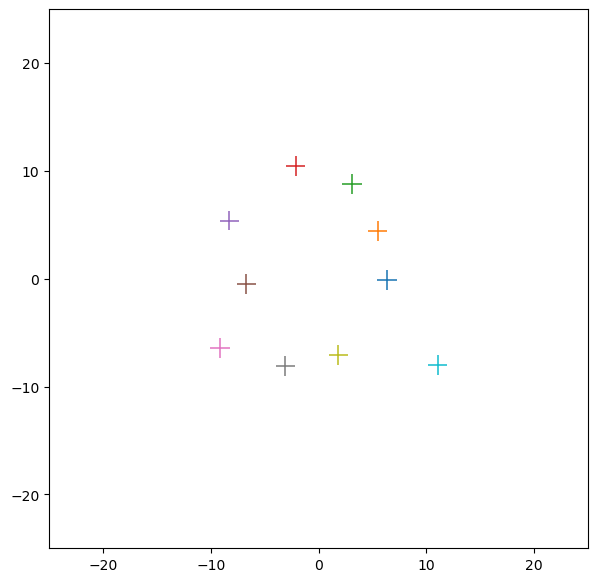

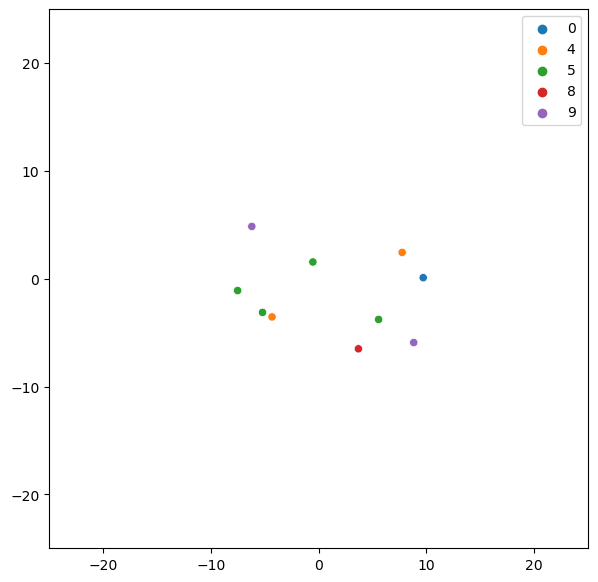

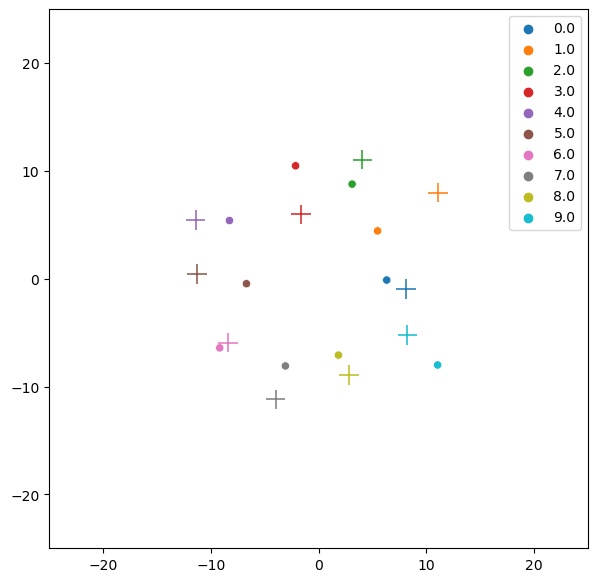

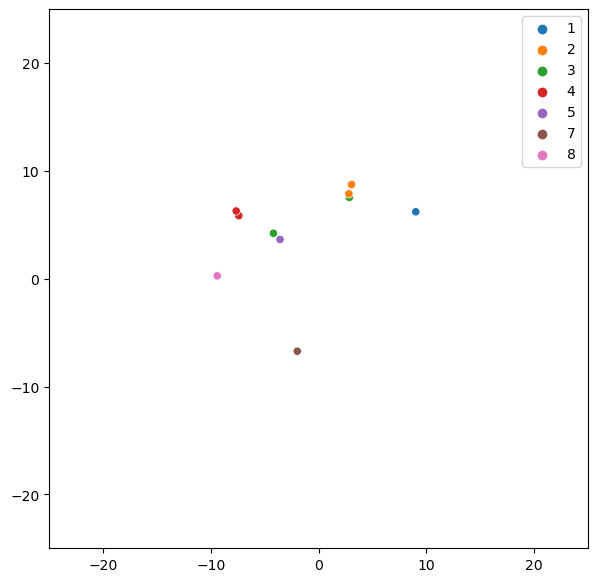

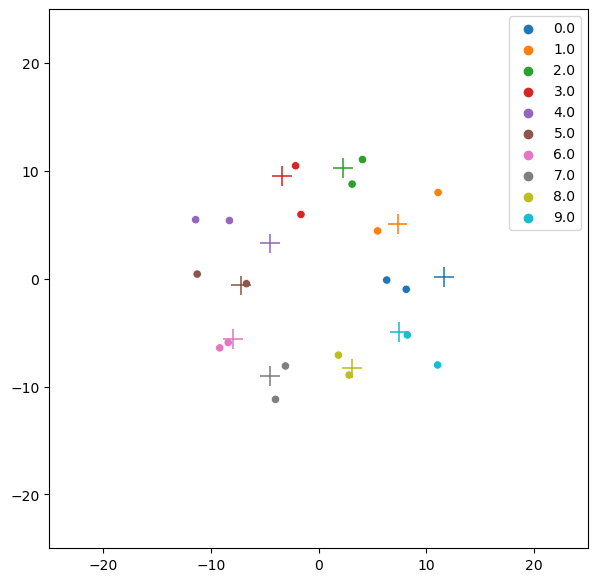

...

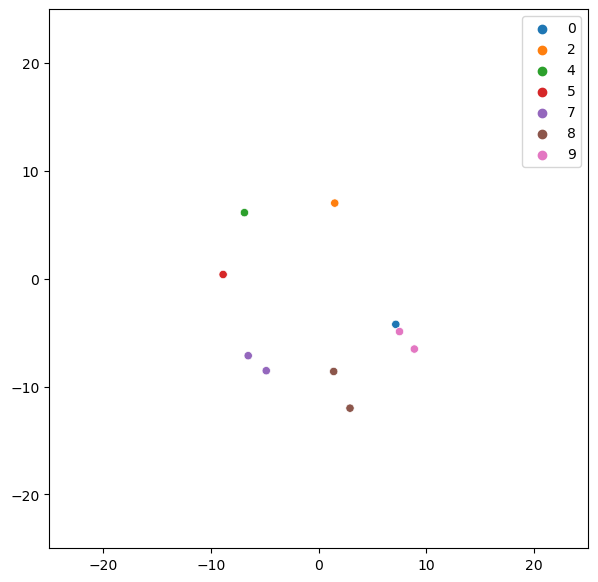

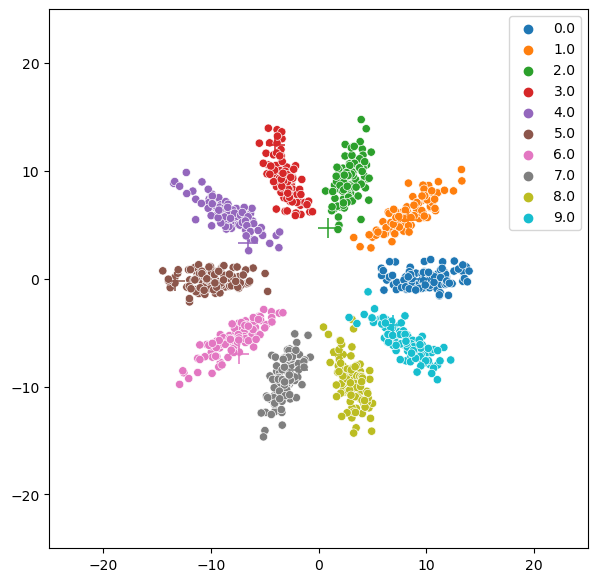

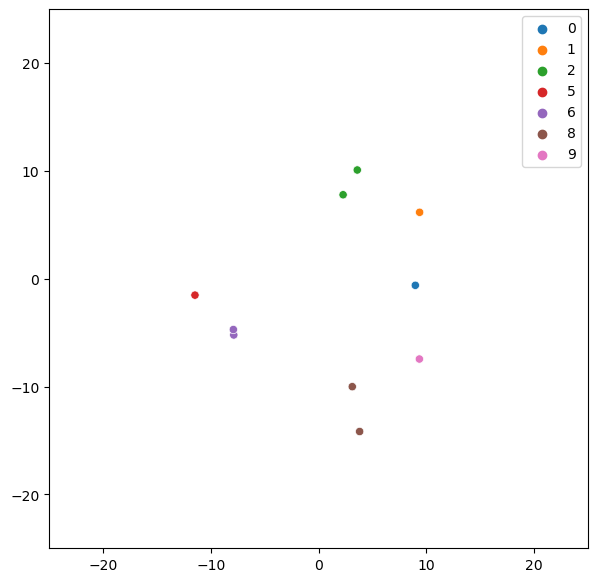

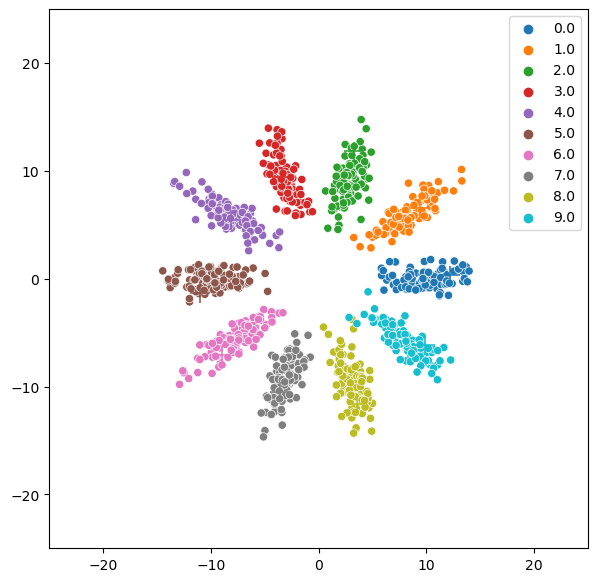

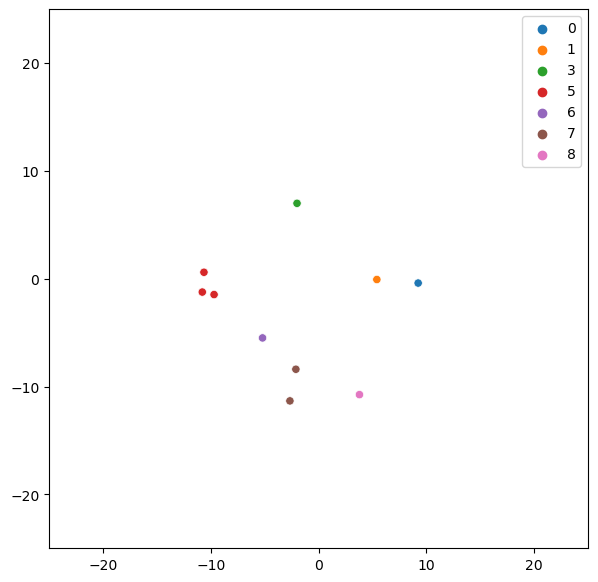

In [10]:
# with torch.autograd.set_detect_anomaly(True):
# torch.autograd.set_detect_anomaly(True)
hp["run_name"] = "AAE_exp_2-3"
# hp["wandb"] = "disabled"

encoder, decoder, discriminator = train2_3(hp)

In [11]:
test_dataset = MNIST(
    root="C:/Users/paoki/workspace/AAE/mnist",
    train=False,
    transform=transforms.Compose([transforms.ToTensor(), transforms.Normalize([0.5], [0.5])]),
    # sigmoid를 쓸때, tanh를 쓸 때 normalize 값 변경 필요
)

criterion_mse = nn.MSELoss()
criterion_bce = nn.BCELoss()

In [ ]:
# test_loader = DataLoader(dataset=test_dataset, batch_size=100, shuffle=False)

# fig = plt.figure(figsize=(7, 7))
# ax = fig.add_subplot(111)

# # ax.set_xlim(-10, 10)
# # ax.set_ylim(-10, 10)

# with torch.no_grad():
#     print("Calculating validation results...")
#     encoder.eval()
#     decoder.eval()
#     discriminator.eval()

#     loss_test_r_list = []
#     loss_test_d_list = []
#     loss_test_g_list = []

#     z_list = []
#     label_list = []

#     for img, label in test_loader:
#         img = img.to(hp["device"])
#         label_list.append(label)
#         label = label.to(hp["device"])

#         z = encoder(img)
#         z_list.append(z)
#         x_rc = decoder(z)
#         x_rc = x_rc.view(x_rc.size(0), 1, 28, 28)
#         loss_test_reconstruction = criterion_mse(x_rc, img)  # loss_reconstruction 계산

#         # Regularization Phase
#         # discriminator
#         class_label = torch.zeros(img.size(0), 11).to(hp["device"])

#         sam = torch.Tensor(np.random.normal(0, 1, (img.size(0), 2))).to(hp["device"])

#         z_real = torch.vmap(similarity)(label, sam)
#         z_real = z_real
#         # label이 지정하는 분포에서 표본 추출

#         class_label = F.one_hot(label, num_classes=11)
#         # 11차원 one-hot vector로 변경

#         z_fake = torch.concat((z, class_label), dim=-1)
#         z_real = torch.concat((z_real, class_label), dim=-1)

#         real = torch.full((img.size(0), 1), 1.0).to(hp["device"])
#         fake = torch.full((img.size(0), 1), 0.0).to(hp["device"])
#         # BCE에 넣을 real, fake label 정보

#         loss_test_D = criterion_bce(discriminator(z_real), real) + criterion_bce(
#             discriminator(z_fake), fake
#         )  # loss_D 계산

#         # generator

#         loss_test_G = -1 * (
#             criterion_bce(discriminator(z_real), real) + criterion_bce(discriminator(z_fake), fake)
#         )  # loss_G 계산 -1 * loss_D

#         loss_test_r_list.append(loss_test_reconstruction.item())
#         loss_test_d_list.append(loss_test_D.item())
#         loss_test_g_list.append(loss_test_G.item())

#     loss_test_r = np.sum(loss_test_r_list) / len(test_loader)
#     loss_test_d = np.sum(loss_test_d_list) / len(test_loader)
#     loss_test_g = np.sum(loss_test_g_list) / len(test_loader)

#     print(f"[test] loss_r: {loss_test_r:4.2}, loss_d: {loss_test_d:4.2}, loss_g: {loss_test_g:4.2}")

#     z_numpy = torch.cat(z_list, dim=0).detach().cpu().numpy()
#     # print(f"==>> z_numpy.shape: {z_numpy.shape}")
#     label_numpy = torch.cat(label_list, dim=0).numpy()

#     sns.scatterplot(x=z_numpy[:, 0], y=z_numpy[:, 1], hue=label_numpy, palette="tab10")


# plt.show()

# # @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

# test_loader = DataLoader(dataset=test_dataset, batch_size=1, shuffle=True)

# fig = plt.figure(figsize=(7, 7))
# ax = fig.add_subplot(111)

# # ax.set_xlim(-10, 10)
# # ax.set_ylim(-10, 10)

# with torch.no_grad():
#     print("Calculating validation results...")
#     encoder.eval()
#     decoder.eval()
#     discriminator.eval()

#     loss_test_r_list = []
#     loss_test_d_list = []
#     loss_test_g_list = []

#     img, label = next(iter(test_loader))
#     img = img.to(hp["device"])
#     label_keep = label
#     label = label.to(hp["device"])

#     z = encoder(img)
#     # print(f"==>> z: {z}")
#     x_rc = decoder(z)
#     x_rc = x_rc.view(x_rc.size(0), 1, 28, 28)
#     loss_test_reconstruction = criterion_mse(x_rc, img)  # loss_reconstruction 계산

#     # Regularization Phase
#     # discriminator
#     class_label = torch.zeros(img.size(0), 11).to(hp["device"])

#     sam = torch.Tensor(np.random.normal(0, 1, (img.size(0), 2))).to(hp["device"])

#     z_real = torch.vmap(similarity)(label, sam)
#     z_real = z_real
#     # label이 지정하는 분포에서 표본 추출

#     class_label = F.one_hot(label, num_classes=11)
#     # 11차원 one-hot vector로 변경

#     z_fake = torch.concat((z, class_label), dim=-1)
#     z_real = torch.concat((z_real, class_label), dim=-1)

#     real = torch.full((img.size(0), 1), 1.0).to(hp["device"])
#     fake = torch.full((img.size(0), 1), 0.0).to(hp["device"])
#     # BCE에 넣을 real, fake label 정보

#     loss_test_D = criterion_bce(discriminator(z_real), real) + criterion_bce(
#         discriminator(z_fake), fake
#     )  # loss_D 계산

#     # generator

#     loss_test_G = -1 * (
#         criterion_bce(discriminator(z_real), real) + criterion_bce(discriminator(z_fake), fake)
#     )  # loss_G 계산 -1 * loss_D

#     loss_test_r_list.append(loss_test_reconstruction.item())
#     loss_test_d_list.append(loss_test_D.item())
#     loss_test_g_list.append(loss_test_G.item())

#     loss_test_r = np.sum(loss_test_r_list) / len(test_loader)
#     loss_test_d = np.sum(loss_test_d_list) / len(test_loader)
#     loss_test_g = np.sum(loss_test_g_list) / len(test_loader)

#     print(f"[test] loss_r: {loss_test_r:4.2}, loss_d: {loss_test_d:4.2}, loss_g: {loss_test_g:4.2}")

#     # z_numpy = z.detach().cpu().numpy()

#     # sns.scatterplot(x=z_numpy[:, 0], y=z_numpy[:, 1], hue=label_keep, palette="Set2")

#     plt.imshow(x_rc.squeeze(0).permute(1, 2, 0).cpu())


# plt.show()

# # @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

Calculating validation results...
[test] loss_r: 0.19, loss_d:  1.4, loss_g: -1.4


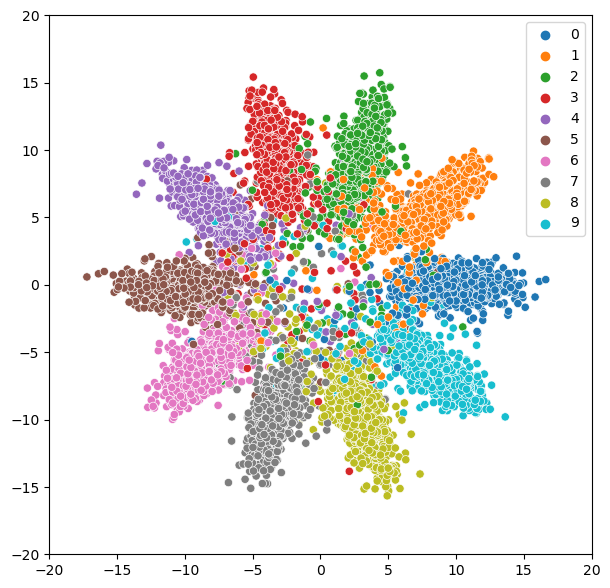

In [14]:
test_loader = DataLoader(dataset=test_dataset, batch_size=100, shuffle=False)

fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(111)

ax.set_xlim(-20, 20)
ax.set_ylim(-20, 20)

with torch.no_grad():
    print("Calculating validation results...")
    encoder.eval()
    decoder.eval()
    discriminator.eval()

    loss_test_r_list = []
    loss_test_d_list = []
    loss_test_g_list = []

    z_list = []
    label_list = []

    for img, label in test_loader:
        img = img.to(hp["device"])
        label_list.append(label)
        label = label.to(hp["device"])

        z = encoder(img)
        z_list.append(z)
        x_rc = decoder(z)
        x_rc = x_rc.view(x_rc.size(0), 1, 28, 28)
        loss_test_reconstruction = criterion_mse(x_rc, img)  # loss_reconstruction 계산

        # Regularization Phase
        # discriminator
        class_label = torch.zeros(img.size(0), 11).to(hp["device"])

        sam = torch.Tensor(np.random.normal(0, 1, (img.size(0), 2))).to(hp["device"])

        z_real = torch.vmap(similarity)(label, sam)
        z_real = z_real
        # label이 지정하는 분포에서 표본 추출

        class_label = F.one_hot(label, num_classes=11)
        # 11차원 one-hot vector로 변경

        z_fake = torch.concat((z, class_label), dim=-1)
        z_real = torch.concat((z_real, class_label), dim=-1)

        real = torch.full((img.size(0), 1), 1.0).to(hp["device"])
        fake = torch.full((img.size(0), 1), 0.0).to(hp["device"])
        # BCE에 넣을 real, fake label 정보

        loss_test_D = criterion_bce(discriminator(z_real), real) + criterion_bce(
            discriminator(z_fake), fake
        )  # loss_D 계산

        # generator

        loss_test_G = -1 * (
            criterion_bce(discriminator(z_real), real) + criterion_bce(discriminator(z_fake), fake)
        )  # loss_G 계산 -1 * loss_D

        loss_test_r_list.append(loss_test_reconstruction.item())
        loss_test_d_list.append(loss_test_D.item())
        loss_test_g_list.append(loss_test_G.item())

    loss_test_r = np.sum(loss_test_r_list) / len(test_loader)
    loss_test_d = np.sum(loss_test_d_list) / len(test_loader)
    loss_test_g = np.sum(loss_test_g_list) / len(test_loader)

    print(f"[test] loss_r: {loss_test_r:4.2}, loss_d: {loss_test_d:4.2}, loss_g: {loss_test_g:4.2}")

    z_numpy = torch.cat(z_list, dim=0).detach().cpu().numpy()
    # print(f"==>> z_numpy.shape: {z_numpy.shape}")
    label_numpy = torch.cat(label_list, dim=0).numpy()

    sns.scatterplot(x=z_numpy[:, 0], y=z_numpy[:, 1], hue=label_numpy, palette="tab10")


plt.show()

Calculating validation results...
[test] loss_r: 4e-06, loss_d: 0.00014, loss_g: -0.00014


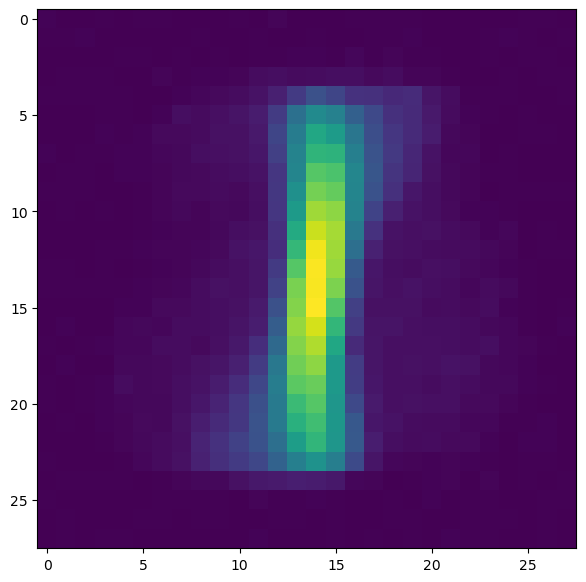

In [13]:

# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

test_loader = DataLoader(dataset=test_dataset, batch_size=1, shuffle=True)

fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(111)

# ax.set_xlim(-10, 10)
# ax.set_ylim(-10, 10)

with torch.no_grad():
    print("Calculating validation results...")
    encoder.eval()
    decoder.eval()
    discriminator.eval()

    loss_test_r_list = []
    loss_test_d_list = []
    loss_test_g_list = []

    img, label = next(iter(test_loader))
    img = img.to(hp["device"])
    label_keep = label
    label = label.to(hp["device"])

    z = encoder(img)
    # print(f"==>> z: {z}")
    x_rc = decoder(z)
    x_rc = x_rc.view(x_rc.size(0), 1, 28, 28)
    loss_test_reconstruction = criterion_mse(x_rc, img)  # loss_reconstruction 계산

    # Regularization Phase
    # discriminator
    class_label = torch.zeros(img.size(0), 11).to(hp["device"])

    sam = torch.Tensor(np.random.normal(0, 1, (img.size(0), 2))).to(hp["device"])

    z_real = torch.vmap(similarity)(label, sam)
    z_real = z_real
    # label이 지정하는 분포에서 표본 추출

    class_label = F.one_hot(label, num_classes=11)
    # 11차원 one-hot vector로 변경

    z_fake = torch.concat((z, class_label), dim=-1)
    z_real = torch.concat((z_real, class_label), dim=-1)

    real = torch.full((img.size(0), 1), 1.0).to(hp["device"])
    fake = torch.full((img.size(0), 1), 0.0).to(hp["device"])
    # BCE에 넣을 real, fake label 정보

    loss_test_D = criterion_bce(discriminator(z_real), real) + criterion_bce(
        discriminator(z_fake), fake
    )  # loss_D 계산

    # generator

    loss_test_G = -1 * (
        criterion_bce(discriminator(z_real), real) + criterion_bce(discriminator(z_fake), fake)
    )  # loss_G 계산 -1 * loss_D

    loss_test_r_list.append(loss_test_reconstruction.item())
    loss_test_d_list.append(loss_test_D.item())
    loss_test_g_list.append(loss_test_G.item())

    loss_test_r = np.sum(loss_test_r_list) / len(test_loader)
    loss_test_d = np.sum(loss_test_d_list) / len(test_loader)
    loss_test_g = np.sum(loss_test_g_list) / len(test_loader)

    print(f"[test] loss_r: {loss_test_r:4.2}, loss_d: {loss_test_d:4.2}, loss_g: {loss_test_g:4.2}")

    # z_numpy = z.detach().cpu().numpy()

    # sns.scatterplot(x=z_numpy[:, 0], y=z_numpy[:, 1], hue=label_keep, palette="Set2")

    plt.imshow(x_rc.squeeze(0).permute(1, 2, 0).cpu())


plt.show()

# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@